## Image Forgery Detection

### Objective:

* Given an image,the task is to find out if it has been forged/tampered.

In [ ]:
#Importing all the necessary modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import itertools
from tqdm import tqdm
import random
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.optimizers import RMSprop,Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.preprocessing.image import ImageDataGenerator
import os
from PIL import Image, ImageChops, ImageEnhance
from IPython.display import display # to display images


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#https://gist.github.com/cirocosta/33c758ad77e6e6531392
#error level analysis of an image
def ELA(img_path):
    """Performs Error Level Analysis over a directory of images"""

    TEMP = 'ela_' + 'temp.jpg'
    SCALE = 10
    original = Image.open(img_path)
    try:
        original.save(TEMP, quality=100)
        temporary = Image.open(TEMP)
        diff = ImageChops.difference(original, temporary)

    except:

        original.convert('RGB').save(TEMP, quality=90)
        temporary = Image.open(TEMP)
        diff = ImageChops.difference(original.convert('RGB'), temporary)


    d = diff.load()

    WIDTH, HEIGHT = diff.size
    for x in range(WIDTH):
        for y in range(HEIGHT):
            #print(d[x,y])
            d[x, y] = tuple(k * SCALE for k in d[x, y])

    return diff


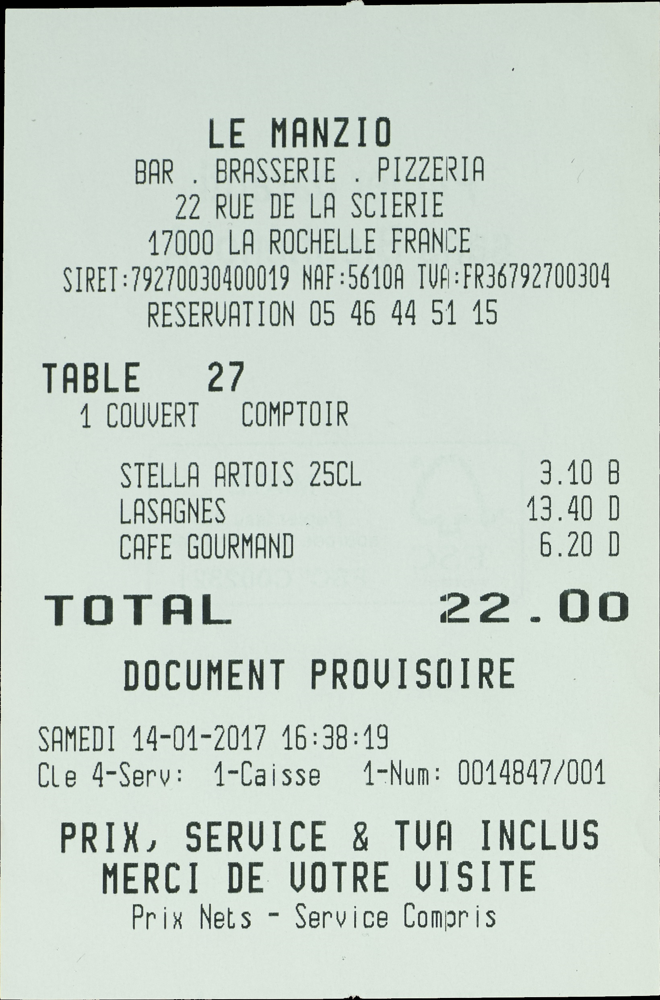

In [ ]:
orig_img = Image.open('/content/drive/MyDrive/dataset/pristine/1844.jpg')
display(orig_img)

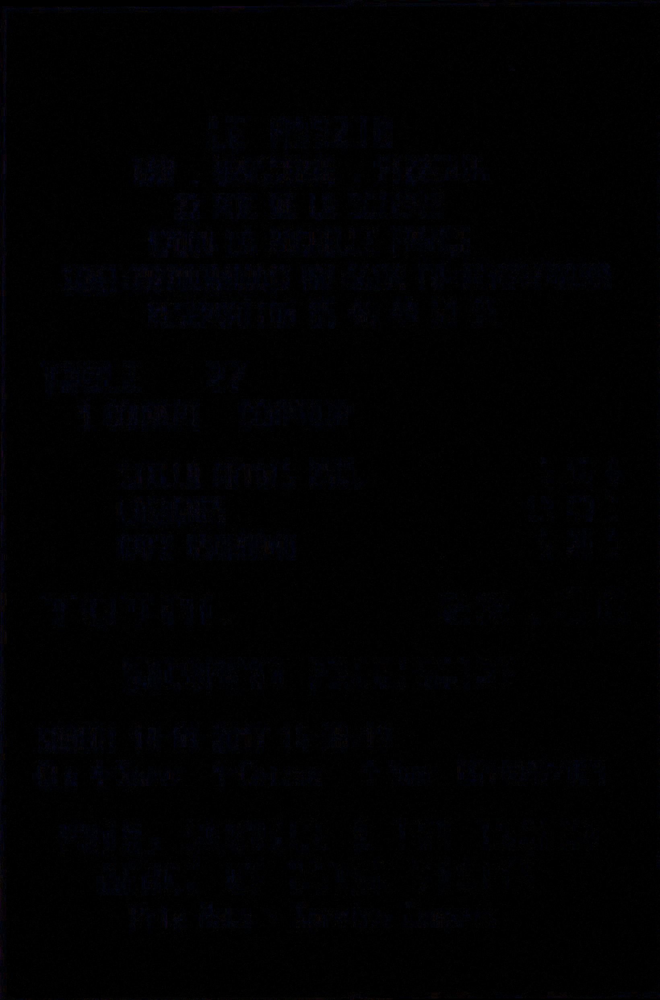

In [ ]:
ELA('/content/drive/MyDrive/dataset/pristine/1844.jpg')

### Tampered Image

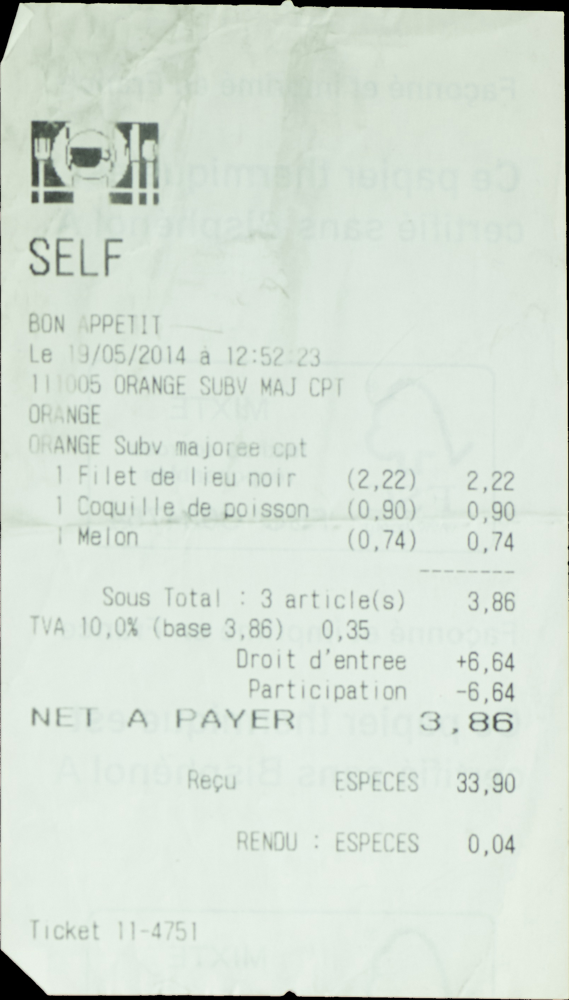

In [ ]:
tampered_img = Image.open('/content/drive/MyDrive/dataset/fake/1046.jpg')
display(tampered_img)

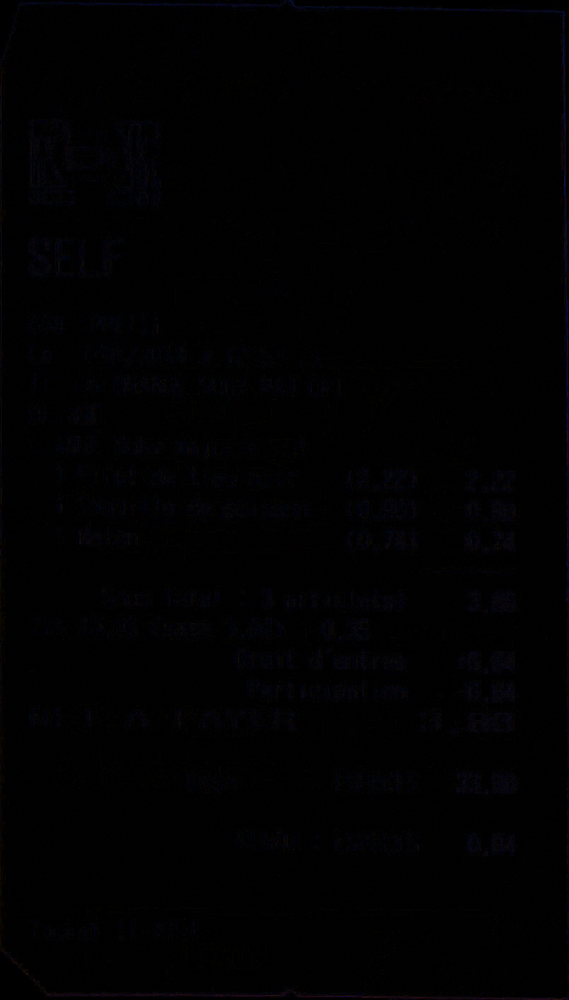

In [ ]:
ELA('/content/drive/MyDrive/dataset/fake/1046.jpg')

In [ ]:
path_original = '/content/drive/MyDrive/dataset/pristine'
path_tampered = '/content/drive/MyDrive/dataset/fake'

total_original = os.listdir(path_original)
total_tampered = os.listdir(path_tampered)

In [ ]:
len(total_original)

80

In [ ]:
len(total_tampered)

200

In [ ]:

images = []

for file in tqdm(os.listdir(path_original)):
    try:
        line = path_original + '/' + file + ',0\n'
        images.append(line)
    except:
        print(path_original + file)


100%|██████████| 80/80 [00:00<00:00, 321402.61it/s]


In [ ]:
for file in tqdm(os.listdir(path_tampered)):
    try:
        if file.endswith('.jpg') and not file.endswith('.mask.jpg'):
            line = path_tampered + '/' + file + ',1\n'
            images.append(line)
    except:
        print(path_tampered + file)


100%|██████████| 200/200 [00:00<00:00, 485732.95it/s]


In [ ]:
images

['/content/drive/MyDrive/dataset/pristine/1118.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/102.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1078.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/135.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1127.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/11.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1354.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/140.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1362.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1389.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1358.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1377.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/141.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1430.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1686.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/1416.jpg,0\n',
 '/content/drive/MyDrive/dataset/pristine/173.jpg,0\n',
 '/content/drive/MyDrive/dataset/prist

In [ ]:
len(images)

180

In [ ]:
image_name = []
label = []
for i in tqdm(range(len(images))):
    image_name.append(images[i][0:-3])
    label.append(images[i][-2])


100%|██████████| 180/180 [00:00<00:00, 154834.85it/s]


In [ ]:
dataset = pd.DataFrame({'image':image_name,'class_label':label})

In [ ]:
dataset['class_label'].value_counts()


1    100
0     80
Name: class_label, dtype: int64

### Class labels

It is important to note that:
* class label 1 ===>tampered
* class label 0====>real

In [ ]:
dataset.head()

,image,class_label
0,/content/drive/MyDrive/dataset/pristine/1118.jpg,0
1,/content/drive/MyDrive/dataset/pristine/102.jpg,0
2,/content/drive/MyDrive/dataset/pristine/1078.jpg,0
3,/content/drive/MyDrive/dataset/pristine/135.jpg,0
4,/content/drive/MyDrive/dataset/pristine/1127.jpg,0


In [ ]:
dataset.to_csv('/content/drive/MyDrive/dataset/dataset.csv',index=False)

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/dataset/dataset.csv')

In [ ]:
len(dataset)

180

In [ ]:
x_casia = []
y_casia = []

In [ ]:
for index, row in tqdm(dataset.iterrows()):
    x_casia.append(np.array(ELA(row[0]).resize((128, 128))).flatten() / 255.0)
    y_casia.append(row[1])

180it [23:46,  7.93s/it]


In [ ]:
#converting X and Y to numpy arrays
x_casia = np.array(x_casia)
y_casia = np.array(y_casia)


### Reshape X

In [ ]:
x_casia = x_casia.reshape(-1, 128, 128, 3)

In [ ]:
x_casia[0]

array([[[0.00392157, 0.00392157, 0.01176471],
        [0.        , 0.        , 0.        ],
        [0.00392157, 0.00392157, 0.00392157],
        ...,
        [0.        , 0.00392157, 0.01176471],
        [0.        , 0.00392157, 0.00784314],
        [0.        , 0.        , 0.        ]],

       [[0.00392157, 0.00784314, 0.01568627],
        [0.00392157, 0.00392157, 0.00392157],
        [0.        , 0.        , 0.        ],
        ...,
        [0.00392157, 0.00392157, 0.01176471],
        [0.00392157, 0.00784314, 0.03137255],
        [0.00392157, 0.00392157, 0.01568627]],

       [[0.00392157, 0.00784314, 0.01176471],
        [0.00392157, 0.00392157, 0.        ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        ],
        [0.00784314, 0.00784314, 0.02745098],
        [0.01176471, 0.00392157, 0.01960784]],

       ...,

       [[0.00392157, 0.00392157, 0.00784314],
        [0.        , 0.        , 0.00392157],
        [0.00392157, 0

In [ ]:
y_casia = to_categorical(y_casia, 2) #y is one hot encoded

In [ ]:
y_casia[0]

array([1., 0.], dtype=float32)

In [ ]:
len(x_casia)

180

### The kernel kept crashing in between and since preparing the dataset itself took 20 mins,the data set was saved and the kernel was restarted again.

In [ ]:
from numpy import save
## save all the data
save('/content/drive/MyDrive/dataset/X_casia.npy', x_casia)
save('/content/drive/MyDrive/dataset/Y_casia.npy',y_casia)

In [ ]:
from numpy import load
x_casia = load('/content/drive/MyDrive/dataset/X_casia.npy')

In [ ]:

y_casia = load('/content/drive/MyDrive/dataset/Y_casia.npy')

### Train-test split

In [ ]:
X_train, X_val, Y_train, Y_val = train_test_split(x_casia, y_casia, test_size = 0.2, random_state=5)

In [ ]:
###model cnn

In [ ]:
model = Sequential()

model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'valid',
                 activation ='relu', input_shape = (128,128,3)))
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'valid',
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(256, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(2, activation = "softmax"))

In [ ]:
optimizer = Adam()

In [ ]:
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 124, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 120, 120, 32)      25632     
                                                                 
 max_pooling2d (MaxPooling2  (None, 60, 60, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 60, 60, 32)        0         
                                                                 
 flatten (Flatten)           (None, 115200)            0         
                                                                 
 dense (Dense)               (None, 256)               29491456  
                                                        

In [ ]:
early_stopping = EarlyStopping(monitor='val_acc',
                              min_delta=0,
                              patience=2,
                              verbose=1, mode='auto')

In [ ]:
history = model.fit(X_train, Y_train, batch_size = 100, epochs = 30,
          validation_data = (X_val, Y_val), verbose = 1, callbacks=[early_stopping])

Epoch 1/30
2/2 [==============================] - ETA: 0s - loss: 0.7213 - accuracy: 0.4653 

2/2 [==============================] - 16s 5s/step - loss: 0.7213 - accuracy: 0.4653 - val_loss: 0.6940 - val_accuracy: 0.3889
Epoch 2/30
2/2 [==============================] - ETA: 0s - loss: 0.6928 - accuracy: 0.5000

2/2 [==============================] - 14s 6s/step - loss: 0.6928 - accuracy: 0.5000 - val_loss: 0.6937 - val_accuracy: 0.3611
Epoch 3/30
2/2 [==============================] - ETA: 0s - loss: 0.6907 - accuracy: 0.6319

2/2 [==============================] - 14s 6s/step - loss: 0.6907 - accuracy: 0.6319 - val_loss: 0.6935 - val_accuracy: 0.5278
Epoch 4/30
2/2 [==============================] - ETA: 0s - loss: 0.6911 - accuracy: 0.5903

2/2 [==============================] - 12s 5s/step - loss: 0.6911 - accuracy: 0.5903 - val_loss: 0.6938 - val_accuracy: 0.4722
Epoch 5/30
2/2 [==============================] - ETA: 0s - loss: 0.6889 - accuracy: 0.5972

2/2 [==============================] - 16s 6s/step - loss: 0.6889 - accuracy: 0.5972 - val_loss: 0.6950 - val_accuracy: 0.4722
Epoch 6/30
2/2 [==============================] - ETA: 0s - loss: 0.6850 - accuracy: 0.6111 

2/2 [==============================] - 14s 4s/step - loss: 0.6850 - accuracy: 0.6111 - val_loss: 0.7002 - val_accuracy: 0.4722
Epoch 7/30
2/2 [==============================] - ETA: 0s - loss: 0.6789 - accuracy: 0.5972

2/2 [==============================] - 15s 5s/step - loss: 0.6789 - accuracy: 0.5972 - val_loss: 0.7152 - val_accuracy: 0.4722
Epoch 8/30
2/2 [==============================] - ETA: 0s - loss: 0.6760 - accuracy: 0.5833

2/2 [==============================] - 14s 5s/step - loss: 0.6760 - accuracy: 0.5833 - val_loss: 0.7239 - val_accuracy: 0.4722
Epoch 9/30
2/2 [==============================] - ETA: 0s - loss: 0.6837 - accuracy: 0.5694

2/2 [==============================] - 14s 5s/step - loss: 0.6837 - accuracy: 0.5694 - val_loss: 0.7296 - val_accuracy: 0.4722
Epoch 10/30
2/2 [==============================] - ETA: 0s - loss: 0.6666 - accuracy: 0.5972

2/2 [==============================] - 14s 6s/step - loss: 0.6666 - accuracy: 0.5972 - val_loss: 0.7118 - val_accuracy: 0.4722
Epoch 11/30
2/2 [==============================] - ETA: 0s - loss: 0.6547 - accuracy: 0.6667

2/2 [==============================] - 13s 5s/step - loss: 0.6547 - accuracy: 0.6667 - val_loss: 0.7120 - val_accuracy: 0.5000
Epoch 12/30
2/2 [==============================] - ETA: 0s - loss: 0.6500 - accuracy: 0.6806

2/2 [==============================] - 14s 5s/step - loss: 0.6500 - accuracy: 0.6806 - val_loss: 0.7400 - val_accuracy: 0.4722
Epoch 13/30
2/2 [==============================] - ETA: 0s - loss: 0.6417 - accuracy: 0.6250 

2/2 [==============================] - 25s 10s/step - loss: 0.6417 - accuracy: 0.6250 - val_loss: 0.7260 - val_accuracy: 0.4167
Epoch 14/30
2/2 [==============================] - ETA: 0s - loss: 0.6214 - accuracy: 0.6944 

2/2 [==============================] - 17s 6s/step - loss: 0.6214 - accuracy: 0.6944 - val_loss: 0.7513 - val_accuracy: 0.4722
Epoch 15/30
2/2 [==============================] - ETA: 0s - loss: 0.6152 - accuracy: 0.6875

2/2 [==============================] - 14s 6s/step - loss: 0.6152 - accuracy: 0.6875 - val_loss: 0.7602 - val_accuracy: 0.4444
Epoch 16/30
2/2 [==============================] - ETA: 0s - loss: 0.5865 - accuracy: 0.7361

2/2 [==============================] - 13s 6s/step - loss: 0.5865 - accuracy: 0.7361 - val_loss: 0.7547 - val_accuracy: 0.4167
Epoch 17/30
2/2 [==============================] - ETA: 0s - loss: 0.5788 - accuracy: 0.7014

2/2 [==============================] - 13s 5s/step - loss: 0.5788 - accuracy: 0.7014 - val_loss: 0.7821 - val_accuracy: 0.4722
Epoch 18/30
2/2 [==============================] - ETA: 0s - loss: 0.5434 - accuracy: 0.7292

2/2 [==============================] - 14s 5s/step - loss: 0.5434 - accuracy: 0.7292 - val_loss: 0.8208 - val_accuracy: 0.4722
Epoch 19/30
2/2 [==============================] - ETA: 0s - loss: 0.5220 - accuracy: 0.7222 

2/2 [==============================] - 14s 4s/step - loss: 0.5220 - accuracy: 0.7222 - val_loss: 0.7842 - val_accuracy: 0.4722
Epoch 20/30
2/2 [==============================] - ETA: 0s - loss: 0.5051 - accuracy: 0.7778 

2/2 [==============================] - 15s 5s/step - loss: 0.5051 - accuracy: 0.7778 - val_loss: 0.7597 - val_accuracy: 0.5000
Epoch 21/30
2/2 [==============================] - ETA: 0s - loss: 0.4958 - accuracy: 0.7778

2/2 [==============================] - 15s 5s/step - loss: 0.4958 - accuracy: 0.7778 - val_loss: 0.7931 - val_accuracy: 0.4722
Epoch 22/30
2/2 [==============================] - ETA: 0s - loss: 0.4317 - accuracy: 0.8264

2/2 [==============================] - 15s 6s/step - loss: 0.4317 - accuracy: 0.8264 - val_loss: 0.8667 - val_accuracy: 0.4722
Epoch 23/30
2/2 [==============================] - ETA: 0s - loss: 0.4114 - accuracy: 0.7917

2/2 [==============================] - 16s 7s/step - loss: 0.4114 - accuracy: 0.7917 - val_loss: 0.7939 - val_accuracy: 0.5278
Epoch 24/30
2/2 [==============================] - ETA: 0s - loss: 0.3802 - accuracy: 0.8542

2/2 [==============================] - 14s 7s/step - loss: 0.3802 - accuracy: 0.8542 - val_loss: 0.8280 - val_accuracy: 0.5000
Epoch 25/30
2/2 [==============================] - ETA: 0s - loss: 0.3712 - accuracy: 0.8403

2/2 [==============================] - 13s 5s/step - loss: 0.3712 - accuracy: 0.8403 - val_loss: 0.8907 - val_accuracy: 0.4722
Epoch 26/30
2/2 [==============================] - ETA: 0s - loss: 0.3121 - accuracy: 0.8819

2/2 [==============================] - 13s 4s/step - loss: 0.3121 - accuracy: 0.8819 - val_loss: 0.8857 - val_accuracy: 0.5000
Epoch 27/30
2/2 [==============================] - ETA: 0s - loss: 0.3018 - accuracy: 0.8819

2/2 [==============================] - 14s 4s/step - loss: 0.3018 - accuracy: 0.8819 - val_loss: 0.9579 - val_accuracy: 0.5000
Epoch 28/30
2/2 [==============================] - ETA: 0s - loss: 0.2285 - accuracy: 0.9236

2/2 [==============================] - 14s 4s/step - loss: 0.2285 - accuracy: 0.9236 - val_loss: 1.0127 - val_accuracy: 0.5278
Epoch 29/30
2/2 [==============================] - ETA: 0s - loss: 0.2182 - accuracy: 0.9167

2/2 [==============================] - 14s 5s/step - loss: 0.2182 - accuracy: 0.9167 - val_loss: 1.0268 - val_accuracy: 0.5833
Epoch 30/30
2/2 [==============================] - ETA: 0s - loss: 0.2253 - accuracy: 0.9167

2/2 [==============================] - 15s 7s/step - loss: 0.2253 - accuracy: 0.9167 - val_loss: 1.1032 - val_accuracy: 0.5833


In [ ]:
model.save('/content/drive/MyDrive/new_model_casia.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


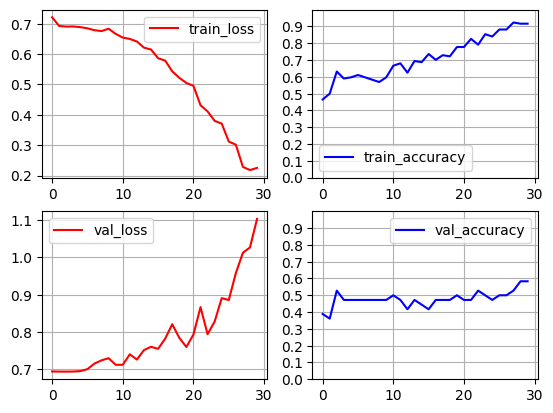

In [ ]:

fig = plt.figure()
p1 = fig.add_subplot(221)
p2 = fig.add_subplot(222)
p3 = fig.add_subplot(223)
p4 = fig.add_subplot(224)

p2.set_ylim(0, 1)
p4.set_ylim(0, 1)
p1.grid()
p2.grid()
p3.grid()
p4.grid()
p2.set_yticks(np.arange(0, 1, 0.1))
p4.set_yticks(np.arange(0, 1, 0.1))

x = [i for i in range(len(history.history['loss']))]
y = history.history['loss']
y2 = history.history['accuracy']
y3 = history.history['val_loss']
y4 = history.history['val_accuracy']

p1.plot(x, y, 'r', label='train_loss')
p1.legend()
p2.plot(x, y2, 'b', label='train_accuracy')
p2.legend()
p3.plot(x, y3, 'r', label='val_loss')
p3.legend()
p4.plot(x, y4, 'b', label='val_accuracy')
p4.legend()

plt.show()


In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
y_pred_cnn = model.predict(X_val)
y_pred_cnn = np.argmax(y_pred_cnn,axis = 1)
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1)

score = metrics.precision_score(Y_true,y_pred_cnn, average= "weighted")
print("Precision score: {}".format(score))
score = metrics.recall_score(Y_true, y_pred_cnn, average= "weighted")
print("Recall score: {}".format(score))
score_lr1 = metrics.f1_score(Y_true, y_pred_cnn, average= "weighted")
print("F1 score: {}".format(score_lr1))

2/2 [==============================] - 1s 84ms/step
Precision score: 0.5895833333333333
Recall score: 0.5833333333333334
F1 score: 0.5823680823680824


Confusion matrix:
 [[10  9]
 [ 6 11]]
              precision    recall  f1-score   support

           0       0.62      0.53      0.57        19
           1       0.55      0.65      0.59        17

    accuracy                           0.58        36
   macro avg       0.59      0.59      0.58        36
weighted avg       0.59      0.58      0.58        36

Plot of Confusion Matrix


<Axes: xlabel='Predicted', ylabel='Actual'>

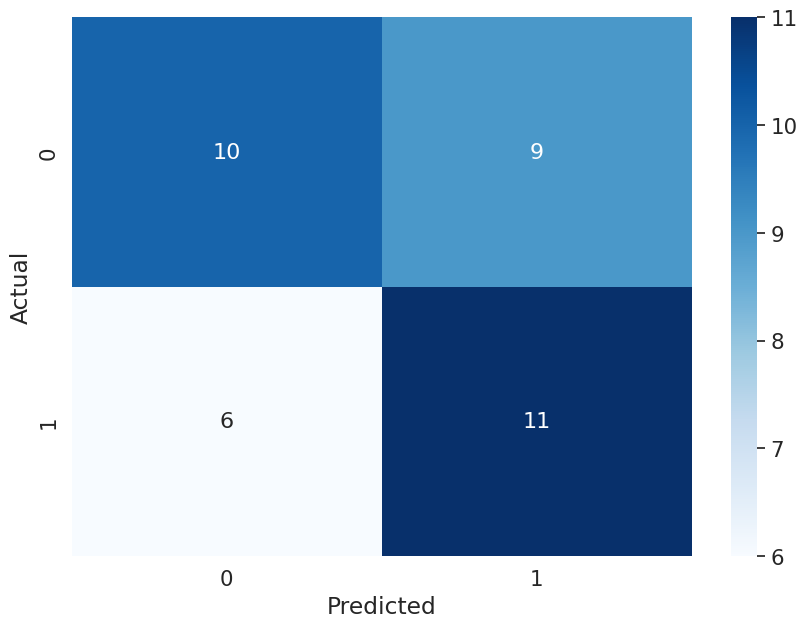

In [ ]:
import seaborn as sns
cm = confusion_matrix(Y_true, y_pred_cnn)
print('Confusion matrix:\n',cm)

print(classification_report(Y_true, y_pred_cnn))

print('Plot of Confusion Matrix')
df_cm = pd.DataFrame(cm, columns=np.unique(Y_true), index = np.unique(Y_true))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

In [ ]:
from sklearn.metrics import roc_auc_score
print('ROC_AUC score:',roc_auc_score(Y_true,y_pred_cnn))
df_cm

ROC_AUC score: 0.8926815213084057


Predicted,0,1
Actual,,
0,1282,229
1,61,906
